In [1]:
from importlib import reload
from rlxutils import subplots
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import torch
import os

import omegaconf
from loguru import logger
from omegaconf import DictConfig, OmegaConf
import hydra
from progressbar import progressbar as pbar

from earthtext.io import io
from earthtext.datamodules import chipmultilabel
from earthtext.datamodules.components.chipmultilabel import embeddings_mean
from earthtext.datamodules.components.chipmultilabel import inputs_mean, inputs_std
from importlib import reload

from earthtext.osm.autocomplete_query import autocomplete_query

from earthtext.osm import multilabel
osmcodes = multilabel.kvmerged.keyvals_codes

reload(chipmultilabel)

<module 'earthtext.datamodules.chipmultilabel' from '/home/ubuntu/earth-text/src/earthtext/datamodules/chipmultilabel.py'>

# get metadata

In [2]:
chips_folder  = "/opt/data/clay-california-worldcover-rgbnir-vvvh-chips/chips"
metadata_file = "/opt/data/california-worldcover-chips/california-worldcover-chips-osm-multilabels.parquet"
metadata = gpd.read_parquet(metadata_file)

In [3]:
def show_autocomplete_samples(has, hasnot, n_samples=10, n_cols=5):

    # build user query
    for c in has + hasnot:
        if not c in osmcodes.keys():
            raise ValueError(f"osm code '{c}' not found")
    
    has_codes = [osmcodes[i] for i in has]
    hasnot_codes = [osmcodes[i] for i in hasnot]
    
    query = np.zeros(297)
    for c in has_codes:
        query[c] = 1
    for c in hasnot_codes:
        query[c] = -1

    # autocomplete
    s, nkept_rows =  autocomplete_query(query, metadata, n_samples)
    print(f"query autocompleted with {n_samples} samples out of {nkept_rows} compatible osm chips from the train data")

    # show chips
    for ax,i in subplots(len(s), n_cols=n_cols):
        item = s.iloc[i]
        cimg = io.read_chip(chips_folder, item['col'], item['row']).numpy()
        cimg = np.transpose(cimg[:3], [1,2,0])
        cimg = cimg / 2000
        cimg[cimg>1] = 1
        plt.imshow(cimg)
        stags_has = str({tag:item.onehot_count[code] for tag, code in zip(has, has_codes)})
        stags_hasnot = str({tag:item.onehot_count[code] for tag, code in zip(hasnot, hasnot_codes)})
        plt.title(f"{item.name}\nhas {stags_has}\nhasnot {stags_hasnot}")
        plt.axis("off")

# show autocompletion results

6232
query autocompleted with 10 samples out of 6232 compatible osm chips from the train data


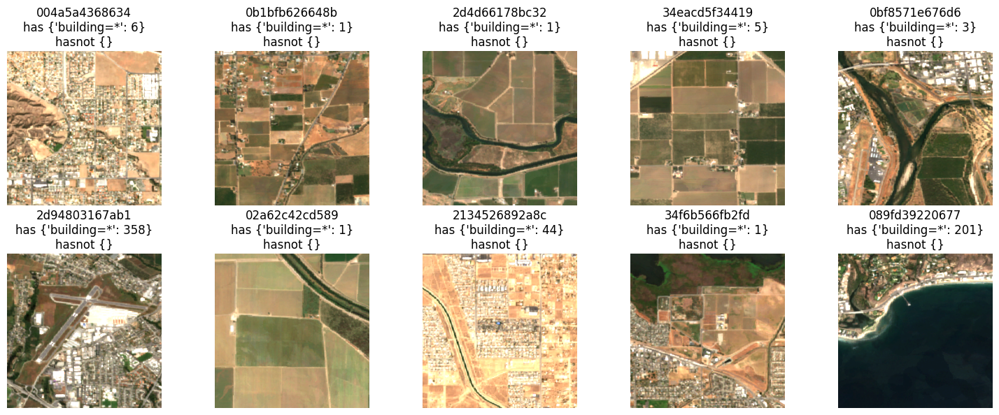

In [5]:
show_autocomplete_samples(has = ['building=*'], hasnot = [])

5351
query autocompleted with 10 samples out of 5351 compatible osm chips from the train data


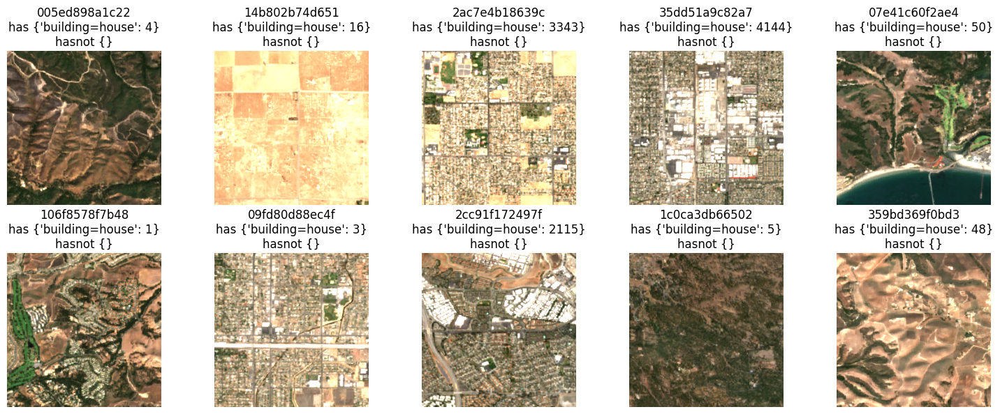

In [4]:
show_autocomplete_samples(has = ['building=house'], hasnot = [])

1783
query autocompleted with 10 samples out of 1783 compatible osm chips from the train data


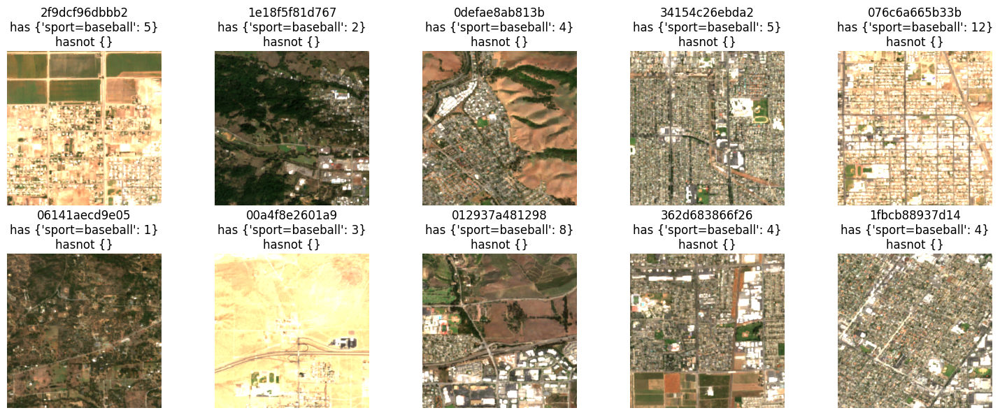

In [21]:
show_autocomplete_samples(has = ['sport=baseball'], hasnot = [])

3457
query autocompleted with 10 samples out of 3457 compatible osm chips from the train data


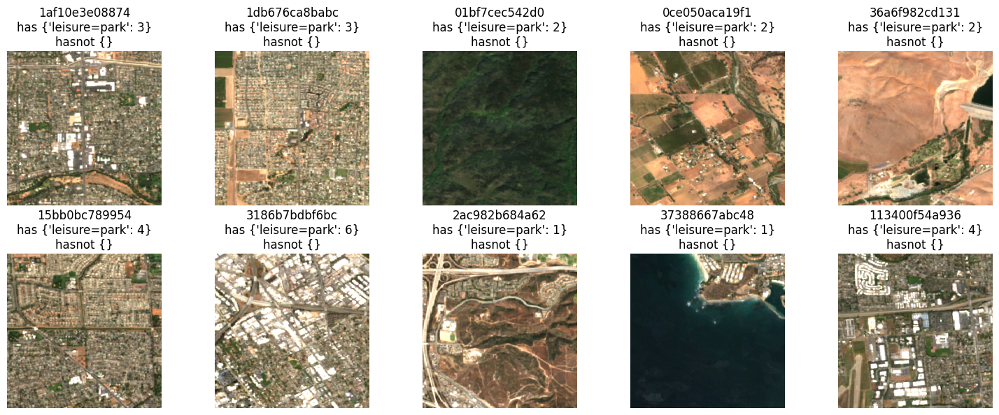

In [22]:
show_autocomplete_samples(has = ['leisure=park'], hasnot = [])

37320
query autocompleted with 10 samples out of 37320 compatible osm chips from the train data


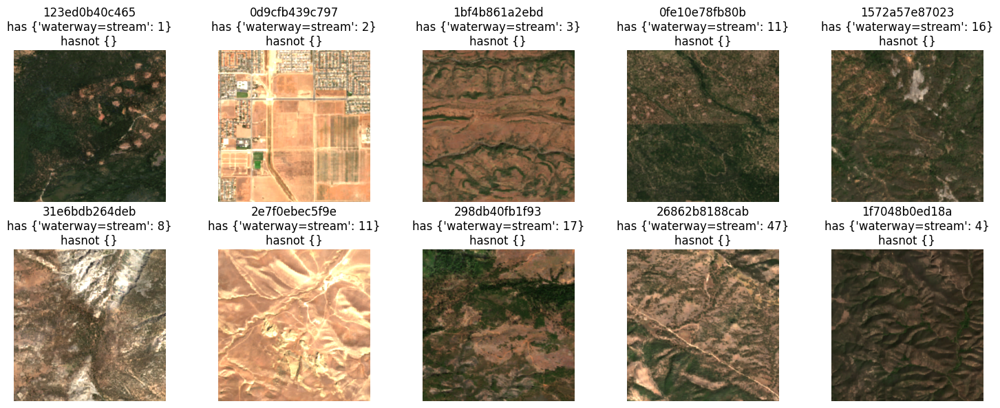

In [28]:
show_autocomplete_samples(has = ['waterway=stream'], hasnot = [])

2300
query autocompleted with 10 samples out of 2300 compatible osm chips from the train data


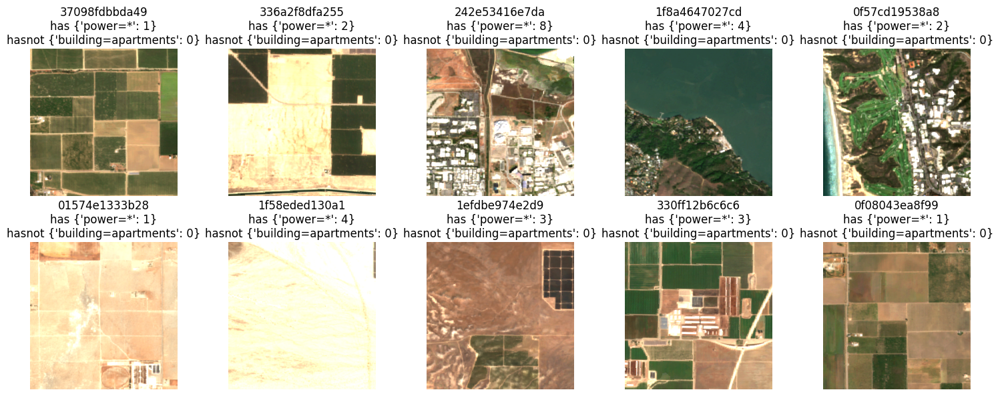

In [29]:
show_autocomplete_samples(has = ['power=*'], hasnot = ['building=apartments'])

48061
query autocompleted with 10 samples out of 48061 compatible osm chips from the train data


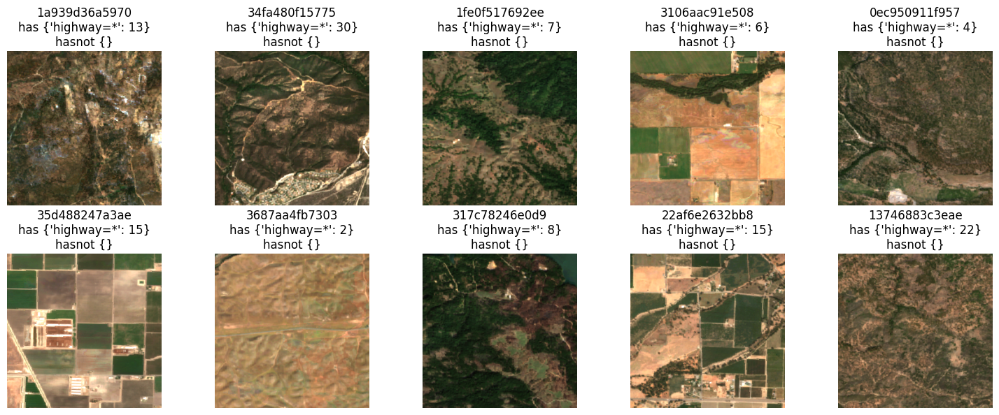

In [31]:
show_autocomplete_samples(has = ['highway=*'], hasnot=[])